# (2.4.2.5)
This version gives the agent more turning options (30 deg) and (10 deg) 

In [25]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
from IPython.display import HTML, display

def animate_episode(episode_data, save_name):
    episode_past_defense_positions = episode_data["past_defense_positions"]
    past_defense_x, past_defense_y = zip(*episode_past_defense_positions)
    episode_past_attack_positions = episode_data["past_attack_positions"]
    past_attack_x, past_attack_y = zip(*episode_past_attack_positions)
    episode_attack_positions = episode_data["attack_positions"]
    attack_x, attack_y = zip(*episode_attack_positions)
    episode_defense_positions = episode_data["defense_positions"]
    defense_x, defense_y = zip(*episode_defense_positions)
    target_position = episode_data["target_position"]

    # Create figure and axis
    fig, ax = plt.subplots()
    plt.xlim(-1, 1)
    plt.ylim(-1, 1)
    plt.axhline(0, color='black', linewidth=0.5)
    plt.axvline(0, color='black', linewidth=0.5)
    plt.grid(True)

    trail_attack, = ax.plot([], [], color='#FFA281', label='Attack Trail')   # Light Red (ATTACK)
    trail_defense, = ax.plot([], [], color='#858585', label='Defense Trail')  
    scatter1, = ax.plot([], [], linestyle='', marker='o', color='#1C1C1C', label='Defense Position')  
    scatter2, = ax.plot([], [], linestyle='', marker='o', color='#FF5A1F', label='Attack Position')  # Black circles
    scatter3, = ax.plot([], [], linestyle='', marker='o', color='#85A3FF', label='Target Position')  # Light Blue circles

    # Update function for animation
    def update(frame):
        trail_attack.set_data(past_attack_x[:frame+1], past_attack_y[:frame+1])
        trail_defense.set_data(past_defense_x[:frame+1], past_defense_y[:frame+1])
        
        scatter1.set_data(attack_x[frame], attack_y[frame])
        scatter2.set_data(defense_x[frame], defense_y[frame])
        scatter3.set_data(target_position[0], target_position[1])
        return trail_attack, trail_defense, scatter1, scatter2, scatter3

    # Create animation
    ani = animation.FuncAnimation(fig, update, frames=len(past_defense_x), interval=200, blit=True)

    # Add legend outside the plot
    ax.legend()

    # # Option 1: Save animation
    # ani.save(save_name, writer='pillow')    
    # print(f"Animation saved as {save_name}")

    # Option 2: Display using HTML
    plt.close(fig)
    video = ani.to_html5_video()
    html = display(HTML(video))

    plt.show()


In [4]:
from copy import deepcopy

log_number = 1

def run_episode(env, model):
    # If you have only one environment wrapped, you can directly access it
    single_env = env.envs[0]
    obs = env.reset()
    done = False
    animate = False
    total_reward = 0
    step = 0
    episode_data = None
    global log_number

    print("EPISODE NUMBER:", log_number)

    episode_data = {
    'past_defense_positions': [], # In upgraded code, we'd only need defense_positions, this is slop, let it work for now
    'past_attack_positions': [],
    'attack_positions': [],
    'defense_positions': [], # because you're basically storing the same data in two different places
    'target_position': [],
    'actions': [],
    'rewards': [],
    'defense_angle': [],
    'defense_attack_theta': [],
    }

    episode_data['target_position'] = obs[0][4:6]

    while not done:
        action, _ = model.predict(obs, deterministic=True)
        episode_data['actions'].append(deepcopy(action))
        episode_data['past_defense_positions'].append(deepcopy(np.array([obs[0][2], obs[0][3]])))
        episode_data['past_attack_positions'].append(deepcopy(np.array([obs[0][0], obs[0][1]])))
        obs, reward, done, info = env.step(action)
        episode_data['rewards'].append(deepcopy(reward))
        episode_data['defense_angle'].append(deepcopy(obs[0][8]))
        episode_data['defense_attack_theta'].append(deepcopy(obs[0][6]))
        episode_data['attack_positions'].append(deepcopy(np.array([obs[0][2], obs[0][3]])))
        episode_data['defense_positions'].append(deepcopy(np.array([obs[0][0], obs[0][1]])))
        total_reward += reward
        step += 1

    print(f"Episode finished in {step} steps with reward {total_reward}. Out of bounds: {single_env.out_of_bounds} ({((single_env.out_of_bounds / (single_env.out_of_bounds + single_env.interceptions + single_env.reached_max_steps + single_env.enemy_impacts)) * 100)}), Interceptions: {single_env.interceptions} ({((single_env.interceptions / (single_env.out_of_bounds + single_env.interceptions + single_env.reached_max_steps + single_env.enemy_impacts)) * 100)}), Reached max steps: {single_env.reached_max_steps} ({((single_env.reached_max_steps / (single_env.out_of_bounds + single_env.interceptions + single_env.reached_max_steps + single_env.enemy_impacts)) * 100)}), Enemy impacts: {single_env.enemy_impacts} ({((single_env.enemy_impacts / (single_env.out_of_bounds + single_env.interceptions + single_env.reached_max_steps + single_env.enemy_impacts)) * 100)})")

    log_number += 1
    
    if episode_data is not None:
        episode_file_name = f'episode_{log_number}_(2.4.2.5)_PROD_11.gif'
        animate_episode(episode_data, episode_file_name)
        #print defense_angles
        print("DEFENSE ANGLES: ", episode_data['defense_angle'])
        print("DEFENSE ATTACK THETAS: ", episode_data['defense_attack_theta'])
        print("ACTIONS: ", episode_data['actions'])
        print("REWARDS: ", episode_data['rewards'])

    # Now access the specific attributes from the single_env which is your actual missile_interception instance
    return step, total_reward, single_env.out_of_bounds, single_env.interceptions, single_env.reached_max_steps, single_env.enemy_impacts

# Create the environment
env = make_vec_env(lambda: missile_interception(), n_envs=1)

# Create the model
model = DQN("MlpPolicy", env, verbose=1, tensorboard_log="./dqn_missile_guidance_local_v(2.4.2.5)_PROD_11")

# Create a summary writer
summary_writer = tf.summary.create_file_writer('./dqn_missile_guidance_local_v(2.4.2.5)_PROD_11/custom_metrics')

# Training loop
total_timesteps = 1200000
eval_interval = 100000  # Evaluate and log every 10000 steps
for step in range(0, total_timesteps, eval_interval):

    # Train for a number of timesteps
    model.learn(total_timesteps=eval_interval, reset_num_timesteps=False)
    
    # Run an evaluation episode
    episode_length, episode_reward, out_of_bounds, interceptions, reached_max_steps, enemy_impacts = run_episode(env, model)
    
    # Log the results
    with summary_writer.as_default():
        tf.summary.scalar('Evaluation/Episode Length', episode_length, step=step)
        # Ensure episode_reward and other metrics are scalars by using .item() if they are numpy arrays or tensors
        tf.summary.scalar('Evaluation/Episode Reward', episode_reward.item() if isinstance(episode_reward, np.ndarray) else episode_reward, step=step)
        tf.summary.scalar('Evaluation/Out of Bounds Count', out_of_bounds.item() if isinstance(out_of_bounds, np.ndarray) else out_of_bounds, step=step)
        tf.summary.scalar('Evaluation/Interceptions Count', interceptions.item() if isinstance(interceptions, np.ndarray) else interceptions, step=step)
        tf.summary.scalar('Evaluation/Reached Max Steps Count', reached_max_steps.item() if isinstance(reached_max_steps, np.ndarray) else reached_max_steps, step=step)
        tf.summary.scalar('Evaluation/Enemy Impacts Count', enemy_impacts.item() if isinstance(enemy_impacts, np.ndarray) else enemy_impacts, step=step)
        summary_writer.flush()


# Save the final model
model.save("dqn_missile_guidance_v(2.4.2.5)_PROD_11")

Using cpu device
Logging to ./dqn_missile_guidance_local_v(2.4.2.5)_PROD_11\DQN_0
ENEMY HIT!
ENEMY HIT!
ENEMY HIT!
HIT!
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.85e+03 |
|    exploration_rate | 0.982     |
| time/               |           |
|    episodes         | 4         |
|    fps              | 929       |
|    time_elapsed     | 0         |
|    total_timesteps  | 188       |
| train/              |           |
|    learning_rate    | 0.0001    |
|    loss             | 314       |
|    n_updates        | 21        |
-----------------------------------
ENEMY HIT!
HIT!
ENEMY HIT!
ENEMY HIT!
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 49.1      |
|    ep_rew_mean      | -4.88e+03 |
|    exploration_rate | 0.963     |
| time/               |           |
|    episodes         | 8         |
|    fps              | 877       |
|    time_elap

c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.out_of_bounds to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.out_of_bounds` for environment variables or `env.get_wrapper_attr('out_of_bounds')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.interceptions to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.interceptions` for environment variables or `env.get_wrapper_attr('interceptions')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.reached_max_steps to get variables from other wrappers is deprecated and will be 

DEFENSE ANGLES:  [4.5112405, 4.5112405, 4.5112405, 4.5112405, 4.5112405, 4.5112405, 4.5112405, 4.5112405, 4.5112405, 4.5112405, 4.5112405, 4.5112405, 4.5112405, 4.5112405, 4.5112405, 4.5112405, 4.6857734, 4.6857734, 4.6857734, 4.6857734, 4.6857734, 4.6857734, 5.144309]
DEFENSE ATTACK THETAS:  [4.6032925, 4.604426, 4.6056695, 4.607041, 4.60856, 4.6102524, 4.6121497, 4.614291, 4.6167274, 4.6195235, 4.6227655, 4.6265697, 4.6310954, 4.6365695, 4.643325, 4.651869, 4.6496763, 4.64669, 4.6423826, 4.6356287, 4.62352, 4.5955215, 0.46867144]
ACTIONS:  [array([2], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([1], dtype=int64), array([0], dtype=int64), a

c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.out_of_bounds to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.out_of_bounds` for environment variables or `env.get_wrapper_attr('out_of_bounds')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.interceptions to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.interceptions` for environment variables or `env.get_wrapper_attr('interceptions')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.reached_max_steps to get variables from other wrappers is deprecated and will be 

Logging to ./dqn_missile_guidance_local_v(2.4.2.5)_PROD_11\DQN_0
HIT!
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 24.7     |
|    ep_rew_mean      | 1.08e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3644     |
|    fps              | 316      |
|    time_elapsed     | 0        |
|    total_timesteps  | 100031   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 410      |
|    n_updates        | 24982    |
----------------------------------
ENEMY HIT!
HIT!
HIT!
HIT!
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 24.8     |
|    ep_rew_mean      | 1.06e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3648     |
|    fps              | 525      |
|    time_elapsed     | 0        |
|    total_timesteps  | 100128   |
| train/              |      

DEFENSE ANGLES:  [6.056878, 0.29729185, 0.29729185, 0.29729185, 0.29729185, 0.29729185, 0.29729185, 0.29729185, 0.29729185, 0.29729185, 0.29729185, 0.29729185, 0.29729185, 0.29729185, 0.29729185, 0.47182477, 5.361906]
DEFENSE ATTACK THETAS:  [0.31043035, 0.3124472, 0.31473917, 0.31736666, 0.3204091, 0.3239731, 0.3282053, 0.3333128, 0.33959815, 0.3475211, 0.357816, 0.37173197, 0.39157718, 0.42213398, 0.4751276, 0.5384285, 3.55697]
ACTIONS:  [array([2], dtype=int64), array([2], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([1], dtype=int64), array([0], dtype=int64)]
REWARDS:  [array([1.8631082], dtype=float32), array([65.983315], dtype=float32), array([57.31538], dtype=float32), array([49.81368

c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.out_of_bounds to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.out_of_bounds` for environment variables or `env.get_wrapper_attr('out_of_bounds')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.interceptions to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.interceptions` for environment variables or `env.get_wrapper_attr('interceptions')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.reached_max_steps to get variables from other wrappers is deprecated and will be 

HIT!
HIT!
HIT!
HIT!
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 24.6     |
|    ep_rew_mean      | 1.15e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7644     |
|    fps              | 573      |
|    time_elapsed     | 0        |
|    total_timesteps  | 200210   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 334      |
|    n_updates        | 50027    |
----------------------------------
HIT!
HIT!
HIT!
HIT!
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 23.9     |
|    ep_rew_mean      | 1.17e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7648     |
|    fps              | 586      |
|    time_elapsed     | 0        |
|    total_timesteps  | 200284   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss      

DEFENSE ANGLES:  [0.765249, 1.288848, 1.4633809, 1.4633809, 1.4633809, 1.4633809, 1.4633809, 1.4633809, 1.4633809, 1.4633809, 1.4633809, 1.4633809, 1.4633809, 1.4633809, 1.4633809, 1.4633809, 1.4633809, 1.4633809, 1.4633809, 1.4633809, 4.320787]
DEFENSE ATTACK THETAS:  [1.5027658, 1.5065986, 1.5061698, 1.5056921, 1.5051566, 1.5045521, 1.5038643, 1.5030746, 1.5021589, 1.5010841, 1.4998049, 1.4982569, 1.4963454, 1.4939255, 1.490763, 1.4864545, 1.4802395, 1.4704939, 1.4530213, 1.4126483, 3.7229407]
ACTIONS:  [array([2], dtype=int64), array([2], dtype=int64), array([1], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dt

c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.out_of_bounds to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.out_of_bounds` for environment variables or `env.get_wrapper_attr('out_of_bounds')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.interceptions to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.interceptions` for environment variables or `env.get_wrapper_attr('interceptions')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.reached_max_steps to get variables from other wrappers is deprecated and will be 

HIT!
HIT!
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 23.9     |
|    ep_rew_mean      | 1.23e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11704    |
|    fps              | 456      |
|    time_elapsed     | 0        |
|    total_timesteps  | 300120   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 658      |
|    n_updates        | 75004    |
----------------------------------
HIT!
HIT!
HIT!
HIT!
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 24.2     |
|    ep_rew_mean      | 1.23e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11708    |
|    fps              | 523      |
|    time_elapsed     | 0        |
|    total_timesteps  | 300231   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6

DEFENSE ANGLES:  [1.0790561, 1.0790561, 1.0790561, 1.0790561, 1.0790561, 1.0790561, 1.0790561, 1.0790561, 1.0790561, 1.0790561, 0.9045232, 0.9045232, 0.9045232, 0.9045232, 0.9045232, 0.9045232, 0.9045232, 0.72999024, 0.72999024, 6.20045]
DEFENSE ATTACK THETAS:  [1.0764012, 1.071281, 1.0655513, 1.059097, 1.0517722, 1.0433887, 1.0337007, 1.0223805, 1.0089811, 0.9928787, 0.9831101, 0.9708841, 0.95514566, 0.93413967, 0.904723, 0.8606818, 0.78791875, 0.6900898, 0.43172273, 1.0534056]
ACTIONS:  [array([3], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([3], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([3], dtype=int64), array([0], dtype=int64), array([3], dtype=int64)]
REWAR

c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.out_of_bounds to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.out_of_bounds` for environment variables or `env.get_wrapper_attr('out_of_bounds')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.interceptions to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.interceptions` for environment variables or `env.get_wrapper_attr('interceptions')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.reached_max_steps to get variables from other wrappers is deprecated and will be 

HIT!
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 24.3     |
|    ep_rew_mean      | 1.09e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15776    |
|    fps              | 748      |
|    time_elapsed     | 0        |
|    total_timesteps  | 400157   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e+03 |
|    n_updates        | 100014   |
----------------------------------
HIT!
HIT!
HIT!
HIT!
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 24.4     |
|    ep_rew_mean      | 1.09e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15780    |
|    fps              | 742      |
|    time_elapsed     | 0        |
|    total_timesteps  | 400253   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 17.7  

DEFENSE ANGLES:  [2.4317634, 2.9553623, 3.4789612, 3.6534941, 3.6534941, 3.8280272, 3.6534941, 3.8280272, 3.6534941, 3.8280272, 3.6534941, 3.8280272, 3.8280272, 3.8280272, 3.8280272, 3.8280272, 3.8280272, 3.8280272, 3.8280272, 3.8280272, 3.8280272, 4.00256, 0.8967556]
DEFENSE ATTACK THETAS:  [3.692537, 3.710453, 3.7188532, 3.7236853, 3.729037, 3.7300165, 3.7363942, 3.7379699, 3.7457638, 3.7482586, 3.7581007, 3.7620847, 3.766818, 3.7725332, 3.7795708, 3.788449, 3.7999964, 3.8156242, 3.8379455, 3.8723857, 3.9322708, 4.0094013, 6.055279]
ACTIONS:  [array([2], dtype=int64), array([2], dtype=int64), array([2], dtype=int64), array([1], dtype=int64), array([0], dtype=int64), array([1], dtype=int64), array([3], dtype=int64), array([1], dtype=int64), array([3], dtype=int64), array([1], dtype=int64), array([3], dtype=int64), array([1], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64)

c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.out_of_bounds to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.out_of_bounds` for environment variables or `env.get_wrapper_attr('out_of_bounds')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.interceptions to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.interceptions` for environment variables or `env.get_wrapper_attr('interceptions')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.reached_max_steps to get variables from other wrappers is deprecated and will be 

HIT!
HIT!
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 24.6     |
|    ep_rew_mean      | 1.12e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19840    |
|    fps              | 790      |
|    time_elapsed     | 0        |
|    total_timesteps  | 500199   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 347      |
|    n_updates        | 125024   |
----------------------------------
ENEMY HIT!
HIT!
HIT!
HIT!
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 24.5     |
|    ep_rew_mean      | 1.1e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19844    |
|    fps              | 805      |
|    time_elapsed     | 0        |
|    total_timesteps  | 500294   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss          

DEFENSE ANGLES:  [1.4207177, 0.89711875, 0.72258586, 0.72258586, 0.72258586, 0.72258586, 0.72258586, 0.72258586, 0.72258586, 0.72258586, 0.72258586, 0.72258586, 0.72258586, 0.72258586, 0.72258586, 0.72258586, 0.72258586, 0.72258586, 0.72258586, 0.72258586, 0.72258586, 0.72258586, 0.72258586, 0.72258586, 3.3860059]
DEFENSE ATTACK THETAS:  [0.762034, 0.7579485, 0.757309, 0.7566112, 0.7558467, 0.7550055, 0.75407535, 0.75304145, 0.7518854, 0.7505842, 0.7491087, 0.74742126, 0.74547285, 0.7431978, 0.74050653, 0.7372733, 0.7333162, 0.72836167, 0.72197866, 0.713446, 0.70146024, 0.68340033, 0.6531114, 0.5920184, 2.1237035]
ACTIONS:  [array([4], dtype=int64), array([4], dtype=int64), array([3], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=

c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.out_of_bounds to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.out_of_bounds` for environment variables or `env.get_wrapper_attr('out_of_bounds')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.interceptions to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.interceptions` for environment variables or `env.get_wrapper_attr('interceptions')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.reached_max_steps to get variables from other wrappers is deprecated and will be 

HIT!
HIT!
HIT!
HIT!
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 24.9     |
|    ep_rew_mean      | 1.32e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23916    |
|    fps              | 497      |
|    time_elapsed     | 0        |
|    total_timesteps  | 600216   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 374      |
|    n_updates        | 150028   |
----------------------------------
HIT!
HIT!
HIT!
HIT!
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 24.9     |
|    ep_rew_mean      | 1.31e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23920    |
|    fps              | 591      |
|    time_elapsed     | 0        |
|    total_timesteps  | 600324   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss      

DEFENSE ANGLES:  [3.7231302, 3.897663, 3.7231302, 3.897663, 3.7231302, 3.897663, 3.7231302, 3.897663, 3.7231302, 3.897663, 3.7231302, 3.897663, 3.374064, 3.897663, 0.75495595]
DEFENSE ATTACK THETAS:  [3.800643, 3.7984464, 3.8029282, 3.8005471, 3.8060906, 3.8035395, 3.8107548, 3.8081446, 3.8183234, 3.8161461, 3.8327322, 3.8334925, 3.9372568, 4.008706, 2.662386]
ACTIONS:  [array([3], dtype=int64), array([1], dtype=int64), array([3], dtype=int64), array([1], dtype=int64), array([3], dtype=int64), array([1], dtype=int64), array([3], dtype=int64), array([1], dtype=int64), array([3], dtype=int64), array([1], dtype=int64), array([3], dtype=int64), array([1], dtype=int64), array([4], dtype=int64), array([2], dtype=int64), array([1], dtype=int64)]
REWARDS:  [array([12.9010935], dtype=float32), array([10.078953], dtype=float32), array([12.531627], dtype=float32), array([10.296967], dtype=float32), array([12.053931], dtype=float32), array([10.624339], dtype=float32), array([11.41231], dtype=float

c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.out_of_bounds to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.out_of_bounds` for environment variables or `env.get_wrapper_attr('out_of_bounds')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.interceptions to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.interceptions` for environment variables or `env.get_wrapper_attr('interceptions')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.reached_max_steps to get variables from other wrappers is deprecated and will be 

Logging to ./dqn_missile_guidance_local_v(2.4.2.5)_PROD_11\DQN_0
HIT!
HIT!
HIT!
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 25.7     |
|    ep_rew_mean      | 1.9e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27948    |
|    fps              | 63       |
|    time_elapsed     | 1        |
|    total_timesteps  | 700064   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 309      |
|    n_updates        | 174990   |
----------------------------------
HIT!
HIT!
HIT!
HIT!
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 25.9     |
|    ep_rew_mean      | 1.9e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27952    |
|    fps              | 108      |
|    time_elapsed     | 1        |
|    total_timesteps  | 700175   |
| train/              |  

DEFENSE ANGLES:  [3.825518, 4.000051, 4.000051, 4.000051, 4.000051, 4.000051, 4.000051, 4.000051, 4.000051, 4.000051, 4.174584, 4.000051, 4.174584, 3.6509848, 4.174584, 4.174584, 4.174584, 4.174584, 4.174584, 4.174584, 4.174584, 4.174584, 4.349117, 4.349117, 4.349117, 2.6736224]
DEFENSE ATTACK THETAS:  [4.0222893, 4.0257463, 4.029503, 4.0335994, 4.038084, 4.043014, 4.04846, 4.0545053, 4.061256, 4.0688415, 4.0716286, 4.0810127, 4.0851426, 4.1109715, 4.1184697, 4.1274233, 4.1382995, 4.1517878, 4.1689506, 4.191511, 4.2224503, 4.2673893, 4.3121037, 4.392575, 4.5752063, 3.0267217]
ACTIONS:  [array([1], dtype=int64), array([1], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([1], dtype=int64), array([3], dtype=int64), array([1], dtype=int64), array([4], dtype=int64), array([2], dtype=int64), array([0], dtype=int64), array(

c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.out_of_bounds to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.out_of_bounds` for environment variables or `env.get_wrapper_attr('out_of_bounds')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.interceptions to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.interceptions` for environment variables or `env.get_wrapper_attr('interceptions')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.reached_max_steps to get variables from other wrappers is deprecated and will be 

HIT!
HIT!
HIT!
HIT!
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 24.5     |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31984    |
|    fps              | 263      |
|    time_elapsed     | 0        |
|    total_timesteps  | 800088   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 589      |
|    n_updates        | 199996   |
----------------------------------
HIT!
HIT!
HIT!
HIT!
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 24.9     |
|    ep_rew_mean      | 1.18e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31988    |
|    fps              | 282      |
|    time_elapsed     | 0        |
|    total_timesteps  | 800194   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss      

DEFENSE ANGLES:  [3.4343796, 3.9579785, 4.4815774, 5.0051765, 5.0051765, 5.0051765, 5.0051765, 5.0051765, 5.0051765, 5.1797094, 5.1797094, 4.9522367]
DEFENSE ATTACK THETAS:  [4.8659005, 4.9123693, 4.9459796, 4.9567375, 4.9704003, 4.9883223, 5.0128417, 5.048368, 5.1042604, 5.168436, 5.313758, 5.8573184]
ACTIONS:  [array([2], dtype=int64), array([2], dtype=int64), array([2], dtype=int64), array([2], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([1], dtype=int64), array([0], dtype=int64), array([1], dtype=int64)]
REWARDS:  [array([0.6985577], dtype=float32), array([1.0477891], dtype=float32), array([2.1533058], dtype=float32), array([20.644438], dtype=float32), array([28.755434], dtype=float32), array([59.33192], dtype=float32), array([130.46422], dtype=float32), array([23.152813], dtype=float32), array([10.092478], dtype=float32), array([88.70335], dtype=float32), array([7.4599967], dtype=f

c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.out_of_bounds to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.out_of_bounds` for environment variables or `env.get_wrapper_attr('out_of_bounds')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.interceptions to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.interceptions` for environment variables or `env.get_wrapper_attr('interceptions')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.reached_max_steps to get variables from other wrappers is deprecated and will be 

Logging to ./dqn_missile_guidance_local_v(2.4.2.5)_PROD_11\DQN_0
HIT!
HIT!
HIT!
HIT!
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 24       |
|    ep_rew_mean      | 1.1e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36040    |
|    fps              | 217      |
|    time_elapsed     | 0        |
|    total_timesteps  | 900088   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 570      |
|    n_updates        | 224996   |
----------------------------------
HIT!
HIT!
HIT!
HIT!
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 24.2     |
|    ep_rew_mean      | 1.1e+04  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36044    |
|    fps              | 267      |
|    time_elapsed     | 0        |
|    total_timesteps  | 900187   |
| train/            

DEFENSE ANGLES:  [3.473763, 3.473763, 3.473763, 3.473763, 3.473763, 3.473763, 3.473763, 3.473763, 3.473763, 2.9501638, 3.473763, 3.29923, 3.473763, 3.29923, 3.822829, 3.648296, 3.648296, 3.648296, 3.648296, 3.648296, 3.822829, 6.139016]
DEFENSE ATTACK THETAS:  [3.527964, 3.5301077, 3.5324702, 3.5350876, 3.5380027, 3.54127, 3.5449567, 3.5491495, 3.5539598, 3.5787845, 3.5869164, 3.6045547, 3.6169865, 3.641959, 3.6398518, 3.6500154, 3.6637006, 3.6831121, 3.7127647, 3.763531, 3.8212283, 0.84643394]
ACTIONS:  [array([1], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([4], dtype=int64), array([2], dtype=int64), array([3], dtype=int64), array([1], dtype=int64), array([3], dtype=int64), array([2], dtype=int64), array([3], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dty

c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.out_of_bounds to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.out_of_bounds` for environment variables or `env.get_wrapper_attr('out_of_bounds')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.interceptions to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.interceptions` for environment variables or `env.get_wrapper_attr('interceptions')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.reached_max_steps to get variables from other wrappers is deprecated and will be 

HIT!
HIT!
HIT!
HIT!
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 25.9     |
|    ep_rew_mean      | 1.09e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40044    |
|    fps              | 370      |
|    time_elapsed     | 0        |
|    total_timesteps  | 1000121  |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 612      |
|    n_updates        | 250005   |
----------------------------------
HIT!
HIT!
HIT!
HIT!
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 25.9     |
|    ep_rew_mean      | 1.09e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40048    |
|    fps              | 429      |
|    time_elapsed     | 0        |
|    total_timesteps  | 1000209  |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss      

DEFENSE ANGLES:  [5.6026254, 5.7771587, 5.7771587, 5.7771587, 5.7771587, 5.7771587, 5.7771587, 5.7771587, 5.7771587, 5.7771587, 5.7771587, 5.7771587, 5.7771587, 5.7771587, 5.7771587, 5.7771587, 5.7771587, 5.7771587, 5.9516916, 5.9516916, 5.9516916, 5.9516916, 5.9516916, 6.1262245, 6.1262245, 0.017571984, 5.0549073]
DEFENSE ATTACK THETAS:  [5.7152686, 5.7183065, 5.7216024, 5.72519, 5.729111, 5.733413, 5.7381554, 5.7434072, 5.7492566, 5.75581, 5.7632027, 5.7716064, 5.781241, 5.792397, 5.805462, 5.820966, 5.839651, 5.8625913, 5.8798738, 5.9022026, 5.9321294, 5.974232, 6.0375366, 6.111613, 6.255091, 0.25878936, 3.8618205]
ACTIONS:  [array([2], dtype=int64), array([1], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dt

c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.out_of_bounds to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.out_of_bounds` for environment variables or `env.get_wrapper_attr('out_of_bounds')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.interceptions to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.interceptions` for environment variables or `env.get_wrapper_attr('interceptions')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.reached_max_steps to get variables from other wrappers is deprecated and will be 

Logging to ./dqn_missile_guidance_local_v(2.4.2.5)_PROD_11\DQN_0
HIT!
HIT!
HIT!
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 24.4     |
|    ep_rew_mean      | 1.24e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 44076    |
|    fps              | 127      |
|    time_elapsed     | 0        |
|    total_timesteps  | 1100071  |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 47.5     |
|    n_updates        | 274992   |
----------------------------------
HIT!
HIT!
HIT!
HIT!
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 24.4     |
|    ep_rew_mean      | 1.25e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 44080    |
|    fps              | 232      |
|    time_elapsed     | 0        |
|    total_timesteps  | 1100163  |
| train/              |  

DEFENSE ANGLES:  [5.4903464, 5.4903464, 5.4903464, 5.4903464, 5.4903464, 5.4903464, 5.4903464, 5.4903464, 5.4903464, 5.4903464, 5.4903464, 5.4903464, 5.4903464, 5.4903464, 5.4903464, 5.4903464, 5.4903464, 5.4903464, 5.4903464, 5.4903464, 5.4903464, 5.4903464, 5.4903464, 5.4903464, 5.3158135, 5.4903464, 5.3158135, 5.4903464, 5.6547356]
DEFENSE ATTACK THETAS:  [5.4697084, 5.4691687, 5.4685884, 5.4679627, 5.467286, 5.4665523, 5.465753, 5.4648795, 5.4639215, 5.462865, 5.4616947, 5.460391, 5.45893, 5.457281, 5.4554057, 5.4532533, 5.4507585, 5.4478316, 5.4443502, 5.440141, 5.4349484, 5.428383, 5.419818, 5.4081783, 5.4105535, 5.3898163, 5.3869114, 5.3250647, 0.55154634]
ACTIONS:  [array([2], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=int64), array([0], dtype=

c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.out_of_bounds to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.out_of_bounds` for environment variables or `env.get_wrapper_attr('out_of_bounds')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.interceptions to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.interceptions` for environment variables or `env.get_wrapper_attr('interceptions')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.reached_max_steps to get variables from other wrappers is deprecated and will be 

In [4]:
import numpy as np
from stable_baselines3 import DQN
from copy import deepcopy
import tensorflow as tf
import gymnasium as gym
import matplotlib.pyplot as plt
from stable_baselines3.common.env_util import make_vec_env

# Function to run an episode
def run_episode(env, model):
    single_env = env.envs[0]
    obs = env.reset()
    done = False
    total_reward = 0
    step = 0
    episode_data = {
        'past_defense_positions': [],
        'past_attack_positions': [],
        'attack_positions': [],
        'defense_positions': [],
        'target_position': [],
        'actions': [],
        'rewards': [],
        'defense_angle': [],
        'defense_attack_theta': [],
    }
    
    episode_data['target_position'] = obs[0][4:6]

    while not done:
        action, _ = model.predict(obs, deterministic=True)
        episode_data['actions'].append(deepcopy(action))
        episode_data['past_defense_positions'].append(deepcopy(np.array([obs[0][2], obs[0][3]])))
        episode_data['past_attack_positions'].append(deepcopy(np.array([obs[0][0], obs[0][1]])))
        obs, reward, done, info = env.step(action)
        episode_data['rewards'].append(deepcopy(reward))
        episode_data['defense_angle'].append(deepcopy(obs[0][8]))
        episode_data['defense_attack_theta'].append(deepcopy(obs[0][6]))
        episode_data['attack_positions'].append(deepcopy(np.array([obs[0][2], obs[0][3]])))
        episode_data['defense_positions'].append(deepcopy(np.array([obs[0][0], obs[0][1]])))
        total_reward += reward
        step += 1

    print(f"Episode finished in {step} steps with reward {total_reward}. Out of bounds: {single_env.out_of_bounds} ({((single_env.out_of_bounds / (single_env.out_of_bounds + single_env.interceptions + single_env.reached_max_steps + single_env.enemy_impacts)) * 100)}), Interceptions: {single_env.interceptions} ({((single_env.interceptions / (single_env.out_of_bounds + single_env.interceptions + single_env.reached_max_steps + single_env.enemy_impacts)) * 100)}), Reached max steps: {single_env.reached_max_steps} ({((single_env.reached_max_steps / (single_env.out_of_bounds + single_env.interceptions + single_env.reached_max_steps + single_env.enemy_impacts)) * 100)}), Enemy impacts: {single_env.enemy_impacts} ({((single_env.enemy_impacts / (single_env.out_of_bounds + single_env.interceptions + single_env.reached_max_steps + single_env.enemy_impacts)) * 100)})")

    return step, total_reward, single_env.out_of_bounds, single_env.interceptions, single_env.reached_max_steps, single_env.enemy_impacts, info, episode_data

# Function to evaluate the model
def evaluate_model(model_path, n_episodes=100):
    # Create the environment
    env = make_vec_env(lambda: missile_interception(), n_envs=1)
    
    # Load the trained model
    model = DQN.load(model_path)
    
    target_hit_episodes = []
    
    # Run multiple evaluation episodes
    for i in range(n_episodes):
        print(f"Running episode {i + 1}")
        episode_length, episode_reward, out_of_bounds, interceptions, reached_max_steps, enemy_impacts, info, episode_data = run_episode(env, model)

        print(info[0]['activated'])
        print("........................................................................................")

        if info[0]['activated'] == True:
            target_hit_episodes.append(episode_data)
    
    return target_hit_episodes

# Function to graph the episode data
def graph_episode(defense_positions, attack_positions, target_position):
    fig, ax = plt.subplots()
    plt.xlim(-1, 1)
    plt.ylim(-1, 1)

    plt.axhline(0, color='black', linewidth=0.5)
    plt.axvline(0, color='black', linewidth=0.5)
    plt.grid(True)

    # Plot trails
    if defense_positions:
        defense_xs, defense_ys = zip(*defense_positions)
        ax.plot(defense_xs, defense_ys, color='#858585', label='Defense Trail')  # Blue line for defense

    if attack_positions:
        attack_xs, attack_ys = zip(*attack_positions)
        ax.plot(attack_xs, attack_ys, color='#FFA281', label='Attack Trail')  # Red line for attack

    # Plot current positions
    plt.scatter(defense_positions[-1][0], defense_positions[-1][1], color='#1C1C1C', label='Defense Position')
    plt.scatter(attack_positions[-1][0], attack_positions[-1][1], color='#FF5A1F', label='Attack Position')
    plt.scatter(target_position[0], target_position[1], color='#85A3FF', label='Target Position')

    ax.set_aspect('equal')
    plt.legend()
    plt.show()

# Path to the saved model
model_path = "dqn_missile_guidance_v(2.4.2.5)_PROD_11"

# Evaluate the model and get episodes with target hits
target_hit_episodes = evaluate_model(model_path, n_episodes=50)

# Graph the episodes with target hits
i = 0
for episode_data in target_hit_episodes:
    episode_name = f'Episode {i} collision.gif '
    animate_episode(episode_data, episode_name)
    i += 1


Running episode 1
HIT!
Episode finished in 33 steps with reward [10718.576]. Out of bounds: 0 (0.0), Interceptions: 1 (100.0), Reached max steps: 0 (0.0), Enemy impacts: 0 (0.0)
False
........................................................................................
Running episode 2
HIT!
Episode finished in 24 steps with reward [10284.181]. Out of bounds: 0 (0.0), Interceptions: 2 (100.0), Reached max steps: 0 (0.0), Enemy impacts: 0 (0.0)
False
........................................................................................
Running episode 3
HIT!
Episode finished in 20 steps with reward [10332.532]. Out of bounds: 0 (0.0), Interceptions: 3 (100.0), Reached max steps: 0 (0.0), Enemy impacts: 0 (0.0)
False
........................................................................................
Running episode 4
HIT!
Episode finished in 29 steps with reward [10496.664]. Out of bounds: 0 (0.0), Interceptions: 4 (100.0), Reached max steps: 0 (0.0), Enemy impacts: 0 (0.0)
Fal

c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.out_of_bounds to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.out_of_bounds` for environment variables or `env.get_wrapper_attr('out_of_bounds')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.interceptions to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.interceptions` for environment variables or `env.get_wrapper_attr('interceptions')` that will search the reminding wrappers.
  logger.warn(
c:\Users\thoma\AppData\Local\Programs\Python\Python311\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.reached_max_steps to get variables from other wrappers is deprecated and will be 

HIT!
Episode finished in 21 steps with reward [10684.321]. Out of bounds: 0 (0.0), Interceptions: 26 (100.0), Reached max steps: 0 (0.0), Enemy impacts: 0 (0.0)
False
........................................................................................
Running episode 27
HIT!
Episode finished in 21 steps with reward [10271.941]. Out of bounds: 0 (0.0), Interceptions: 27 (100.0), Reached max steps: 0 (0.0), Enemy impacts: 0 (0.0)
False
........................................................................................
Running episode 28
HIT!
Episode finished in 30 steps with reward [10613.728]. Out of bounds: 0 (0.0), Interceptions: 28 (100.0), Reached max steps: 0 (0.0), Enemy impacts: 0 (0.0)
False
........................................................................................
Running episode 29
HIT!
Episode finished in 21 steps with reward [10592.858]. Out of bounds: 0 (0.0), Interceptions: 29 (100.0), Reached max steps: 0 (0.0), Enemy impacts: 0 (0.0)
False
........

In [21]:
import gymnasium as gym
from gymnasium import Env
import numpy as np
import matplotlib.pyplot as plt
import random
import math
from stable_baselines3 import DQN
from stable_baselines3.common.env_util import make_vec_env

class missile_interception(Env):
    def __init__(self):
        self.action_space = gym.spaces.discrete.Discrete(5)
        
        low = np.array([-1, -1, -1, -1, -1, -1, 0, 0, 0, 0, 0, 0, -1, -1, -1, -1, -2, -2])
        high = np.array([1, 1, 1, 1, 1, 1, 2*math.pi, 2*math.pi, 2*math.pi, math.pi, 2.9, 2.9, 1, 1, 1, 1, 2, 2])
        self.observation_space = gym.spaces.Box(low=low, high=high, dtype=np.float32)
        self.radius = 0.02

        self.episode_count = 0
        self.distance_t_minus_one = 0
        self.distance_change = 0

        self.out_of_bounds = 0
        self.interceptions = 0
        self.reached_max_steps = 0
        self.enemy_impacts = 0

        self.defense_positions = []
        self.attack_positions = []
        self.attack_starting_position = 0

        self.max_steps_per_episode = 150
        self.activate_value = 0

    def reset(self, seed=None):
        # 1) Seed RNGs for reproducibility
        if seed is not None:
            random.seed(seed)
            np.random.seed(seed)

        # 2) Reset all episode‐specific counters/flags
        self.current_step       = 0
        self.done               = False
        self.reward             = 0
        self.activate_enemy_impact = False
        # (you may also want to clear any “trail” lists here)
        self.defense_positions  = []
        self.attack_positions   = []

        # 3) Pick new random start
        self.create_target()
        self.create_defense(self.target)
        self.create_attack(self.target)

        # 4) Compute all your derived quantities
        self.calc_defense_attack_theta(self.defense, self.attack)
        self.calc_attack_target_theta(self.attack, self.target)
        self.initial_defense_angle()
        self.calc_defense_attack_distance()
        self.calc_attack_target_distance()
        self.attack_starting_position = self.attack.copy()

        # 5) Build your initial state vector
        self.get_state()

        #print("Resetting ------------------------------------")
        #print("attack:", self.attack)
        #print("----------------------------------------------")
        return self.state, {}


    def create_target(self):
        x = random.uniform(-0.3, 0.3)
        y = random.uniform(-0.3, 0.3)
        self.target = np.array([x, y])

    def create_defense(self, target):
        x = random.uniform((target[0] - self.radius) - 0.15, (target[0] + self.radius) + 0.15)
        y = random.uniform((target[1] - self.radius) - 0.15, (target[1] + self.radius) + 0.15)
        self.defense = np.array([x, y])

    def create_attack(self, target):
        x_side_left = random.uniform(-0.95, max(((target[0] - self.radius) - 0.5), -0.94))
        x_side_right = random.uniform(min(((target[0] + self.radius) + 0.5), 0.94), 0.95)
        y_below = random.uniform(max(((target[1] - self.radius) - 0.5), -0.94), -0.95)
        y_above = random.uniform(max(((target[1] + self.radius) + 0.5), 0.94), 0.95)
        x_inclusive = random.uniform(-0.95, 0.95)
        y_inclusive = random.uniform(-0.95, 0.95)
        y_below_x_inclusive = np.array([x_inclusive, y_below])
        y_above_x_inclusive = np.array([x_inclusive, y_above])
        x_left_y_inclusive = np.array([x_side_left, y_inclusive])
        x_right_y_inclusive = np.array([x_side_right, y_inclusive])

        self.attack = random.choice([y_below_x_inclusive, y_above_x_inclusive, x_left_y_inclusive, x_right_y_inclusive])

    def calc_defense_attack_theta(self, defense, attack):
        adjacent_point = np.array([attack[0], defense[1]])
        adj_point_defense_len = abs(defense[0] - adjacent_point[0]) 
        adj_point_attack_len = abs(attack[1] - adjacent_point[1])
        self.defense_attack_theta = np.arctan(adj_point_attack_len / adj_point_defense_len)
        
        if attack[0] > defense[0]:
            if attack[1] > defense[1]:
                self.defense_attack_theta = self.defense_attack_theta
            else: 
                self.defense_attack_theta = (2*math.pi) - self.defense_attack_theta
        else:
            if attack[1] > defense[1]:
                self.defense_attack_theta = math.pi - self.defense_attack_theta
            else:
                self.defense_attack_theta = math.pi + self.defense_attack_theta

    def calc_attack_target_theta(self, attack, target):
        adjacent_point = np.array([target[0], attack[1]])
        adj_point_attack_len = abs(attack[0] - adjacent_point[0])
        adj_point_target_len = abs(target[1] - adjacent_point[1])
        self.attack_target_theta = np.arctan(adj_point_target_len / adj_point_attack_len)

        if target[0] > attack[0]:
            if target[1] > attack[1]:
                self.attack_target_theta = self.attack_target_theta
            else:
                self.attack_target_theta = (2*math.pi) - self.attack_target_theta
        else:
            if target[1] > attack[1]:
                self.attack_target_theta = math.pi - self.attack_target_theta
            else:
                self.attack_target_theta = math.pi + self.attack_target_theta        

    def initial_defense_angle(self):
        self.defense_angle = np.random.uniform((self.defense_attack_theta - 2.35619), (self.defense_attack_theta + 2.35619))
        if self.defense_angle > 2*math.pi:
            self.defense_angle -= 2*math.pi
        elif self.defense_angle < 0:
            self.defense_angle += 2*math.pi

    def calculate_distance(self, point1, point2):
        return math.hypot(point1[0] - point2[0], point1[1] - point2[1])
    
    def calc_defense_attack_distance(self):
        self.defense_attack_distance = self.calculate_distance(self.defense, self.attack) - 2 * self.radius

    def calc_attack_target_distance(self):
        self.attack_target_distance = self.calculate_distance(self.attack, self.target) - 2 * self.radius

    def calc_defense_angle(self, action):
        if action == 0:
            pass
        elif action == 1:
            self.defense_angle += 0.174532925
        elif action == 2:
            self.defense_angle += 0.523599
        elif action == 3:
            self.defense_angle -= 0.174532925
        elif action == 4:
            self.defense_angle -= 0.523599
        
        if self.defense_angle > 2*math.pi:
            self.defense_angle -= 2*math.pi
        elif self.defense_angle < 0:
            self.defense_angle += 2*math.pi

    def update_coords(self):
        self.defense[0] += 0.02 * math.cos(self.defense_angle)
        self.defense[1] += 0.02 * math.sin(self.defense_angle)
        self.attack[0] += 0.02 * math.cos(self.attack_target_theta)
        self.attack[1] += 0.02 * math.sin(self.attack_target_theta)
        self.defense_positions.append(self.defense.copy())
        self.attack_positions.append(self.attack.copy())

    def calculate_reward(self):
        self.calc_defense_attack_distance()
        self.calc_attack_target_distance()

        if self.attack_target_distance < 0:
            print("ENEMY HIT!")
            self.activate_enemy_impact = True
            self.reward = -10000
            self.done = True
            self.enemy_impacts += 1

        elif self.defense_attack_distance < 0:
            print("HIT!")
            self.activate_interception = True
            self.reward = 10000
            self.done = True
            self.interceptions += 1
        else:
            self.angle_diff = abs(self.defense_attack_theta - self.defense_angle)
            self.angle_diff = min(self.angle_diff, 2*math.pi - self.angle_diff)
            self.reward = 1 / self.angle_diff
                
        if not (-1 <= self.defense[0] <= 1 and -1 <= self.defense[1] <= 1):
            print("OUT OF BOUNDS")
            self.reward = -1000
            self.done = True
            self.out_of_bounds += 1

    def angle_conversion(self):
        self.sin_defense_attack_theta = np.sin(self.defense_attack_theta)
        self.sin_defense_angle = np.sin(self.defense_angle)
        self.cos_defense_attack_theta = np.cos(self.defense_attack_theta)
        self.cos_defense_angle = np.cos(self.defense_angle)
        self.delta_sin = self.sin_defense_attack_theta - self.sin_defense_angle
        self.delta_cos = self.cos_defense_attack_theta - self.cos_defense_angle

    def get_state(self):
        self.angle_conversion()
        self.state = np.array([
            self.attack[0], self.attack[1], 
            self.defense[0], self.defense[1], 
            self.target[0], self.target[1],
            self.defense_attack_theta, self.attack_target_theta,
            self.defense_angle,
            min(abs(self.defense_attack_theta - self.defense_angle),
                2*math.pi - abs(self.defense_attack_theta - self.defense_angle)),
            self.defense_attack_distance,
            self.attack_target_distance,
            self.sin_defense_attack_theta, self.cos_defense_attack_theta, 
            self.sin_defense_angle, self.cos_defense_angle,
            self.delta_sin, self.delta_cos
        ])

    def get_state_dict(self):
        return {
            "self.activate": self.activate_enemy_impact,
            "attack_x": self.attack[0],
            "attack_y": self.attack[1],
            "defense_x": self.defense[0],
            "defense_y": self.defense[1],
            "target_x": self.target[0],
            "target_y": self.target[1],
            "defense_attack_theta": self.defense_attack_theta,
            "attack_target_theta": self.attack_target_theta,
            "defense_angle": self.defense_angle,
            "angle_diff": min(abs(self.defense_attack_theta - self.defense_angle),
                              2*math.pi - abs(self.defense_attack_theta - self.defense_angle)),
            "distance_attack_missile": self.defense_attack_distance,
            "distance_attack_target": self.attack_target_distance,
            "sin_defense_attack_theta": self.sin_defense_attack_theta,
            "cos_defense_attack_theta": self.cos_defense_attack_theta,
            "sin_defense_angle": self.sin_defense_angle,
            "cos_defense_angle": self.cos_defense_angle,
            "delta_sin": self.delta_sin,
            "delta_cos": self.delta_cos
        }
                 
    def step(self, action):
        #print("Inside Step -------------------------------------------")
        #print("attack: ", self.attack)
        self.calc_defense_angle(action)
        self.update_coords()
        self.calc_defense_attack_theta(self.defense, self.attack)
        self.calculate_reward()
        self.current_step += 1

        if self.current_step >= self.max_steps_per_episode:
            print("MAX STEPS REACHED")
            self.done = True
            self.reward = -1000
            self.reached_max_steps += 1

        self.get_state()
        #print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")
        #print("attack end state: ", self.attack)
        #print("-------------------------------------------------------")
        return self.state, self.reward, self.done, False, {'activated': self.activate_enemy_impact}

    def graph(self, defense, attack, target):
        fig, ax = plt.subplots()
        plt.xlim(-1, 1)
        plt.ylim(-1, 1)

        plt.axhline(0, color='black', linewidth=0.5)
        plt.axvline(0, color='black', linewidth=0.5)
        plt.grid(True)

        if self.defense_positions:
            defense_xs, defense_ys = zip(*self.defense_positions)
            ax.plot(defense_xs, defense_ys, color='#858585', label='Defense Trail')
        if self.attack_positions:
            attack_xs, attack_ys = zip(*self.attack_positions)
            ax.plot(attack_xs, attack_ys, color='#FFA281', label='Attack Trail')

        plt.scatter(defense[0], defense[1], color='#1C1C1C')
        plt.scatter(attack[0], attack[1], color='#FF5A1F')
        plt.scatter(self.target[0], self.target[1], color='#85A3FF')

        ax.set_aspect('equal')
        plt.show()


Eval failures:   0%|          | 0/2000 [00:00<?, ?it/s]/tmp/ipykernel_33989/2960103831.py:47: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  episode_data['rewards'].append(float(reward))
Eval failures:   2%|▏         | 41/2000 [00:00<00:09, 201.78it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:   3%|▎         | 62/2000 [00:00<00:09, 197.89it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:   5%|▌         | 106/2000 [00:00<00:09, 208.34it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:   7%|▋         | 149/2000 [00:00<00:09, 203.90it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  10%|▉         | 192/2000 [00:00<00:08, 208.82it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  12%|█▏        | 237/2000 [00:01<00:08, 213.78it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  14%|█▍        | 281/2000 [00:01<00:09, 186.75it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  16%|█▋        | 325/2000 [00:01<00:08, 199.73it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  18%|█▊        | 367/2000 [00:01<00:08, 193.56it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  20%|██        | 409/2000 [00:02<00:08, 198.21it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  21%|██▏       | 429/2000 [00:02<00:08, 189.62it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  24%|██▎       | 472/2000 [00:02<00:07, 197.82it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  26%|██▌       | 514/2000 [00:02<00:07, 198.11it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  28%|██▊       | 557/2000 [00:02<00:07, 197.21it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  30%|██▉       | 597/2000 [00:03<00:07, 190.99it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  32%|███▏      | 637/2000 [00:03<00:07, 189.54it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  34%|███▍      | 677/2000 [00:03<00:07, 187.54it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  36%|███▌      | 718/2000 [00:03<00:06, 194.26it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
ENEMY HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  38%|███▊      | 761/2000 [00:03<00:06, 203.88it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  40%|████      | 803/2000 [00:04<00:06, 193.66it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
ENEMY HIT!
HIT!
HIT!
HIT!


Eval failures:  42%|████▏     | 844/2000 [00:04<00:05, 197.00it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  44%|████▍     | 885/2000 [00:04<00:05, 196.05it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  45%|████▌     | 905/2000 [00:04<00:06, 174.39it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  47%|████▋     | 945/2000 [00:04<00:05, 184.42it/s]

ENEMY HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  49%|████▉     | 986/2000 [00:05<00:05, 184.03it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  51%|█████▏    | 1026/2000 [00:05<00:05, 186.30it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  53%|█████▎    | 1069/2000 [00:05<00:04, 198.37it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  56%|█████▌    | 1111/2000 [00:05<00:04, 196.01it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  58%|█████▊    | 1151/2000 [00:05<00:04, 192.66it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  60%|█████▉    | 1194/2000 [00:06<00:04, 200.35it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
ENEMY HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  62%|██████▏   | 1235/2000 [00:06<00:03, 198.52it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  64%|██████▍   | 1277/2000 [00:06<00:03, 197.93it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
ENEMY HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  66%|██████▌   | 1318/2000 [00:06<00:03, 199.21it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  68%|██████▊   | 1361/2000 [00:06<00:03, 206.35it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  70%|███████   | 1405/2000 [00:07<00:02, 209.08it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  72%|███████▏  | 1447/2000 [00:07<00:02, 204.75it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
ENEMY HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  74%|███████▍  | 1488/2000 [00:07<00:02, 195.31it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  75%|███████▌  | 1508/2000 [00:07<00:02, 173.81it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
ENEMY HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  77%|███████▋  | 1548/2000 [00:07<00:02, 176.82it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
ENEMY HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  79%|███████▉  | 1586/2000 [00:08<00:02, 181.02it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  82%|████████▏ | 1631/2000 [00:08<00:01, 199.47it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  84%|████████▎ | 1673/2000 [00:08<00:01, 200.11it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
ENEMY HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  86%|████████▌ | 1714/2000 [00:08<00:01, 194.59it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  88%|████████▊ | 1755/2000 [00:09<00:01, 188.84it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  90%|████████▉ | 1796/2000 [00:09<00:01, 194.42it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  92%|█████████▏| 1838/2000 [00:09<00:00, 199.58it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  93%|█████████▎| 1858/2000 [00:09<00:00, 188.74it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  95%|█████████▍| 1896/2000 [00:09<00:00, 182.15it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  97%|█████████▋| 1934/2000 [00:09<00:00, 184.46it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  99%|█████████▊| 1974/2000 [00:10<00:00, 185.61it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures: 100%|██████████| 2000/2000 [00:10<00:00, 193.65it/s]


HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!

Out of 2000 eps → enemy impacts = 9 (0.45%)


RuntimeError: x must be a sequence

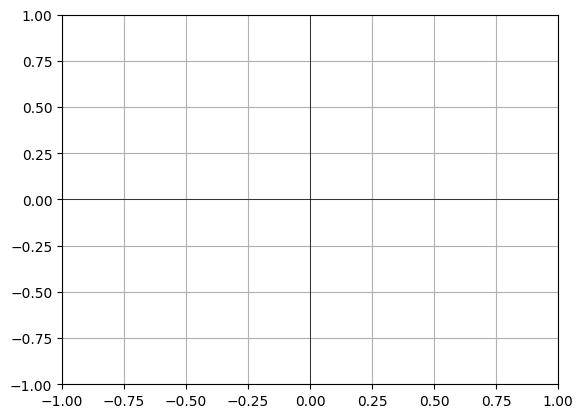

In [24]:
import random
import numpy as np
from stable_baselines3 import DQN
from stable_baselines3.common.env_util import make_vec_env
from tqdm import trange   # pip install tqdm

# assumes animate_episode(episode_data, save_name) is defined (from before)
# assumes missile_interception is imported/defined above

def evaluate_and_collect_failures(model_path, n_episodes=1000, step_limit=1500):
    env   = make_vec_env(lambda: missile_interception(), n_envs=1)
    model = DQN.load(model_path)

    fails        = 0
    fail_thetas  = []
    fail_episodes = []

    for ep in trange(n_episodes, desc="Eval failures"):
        obs        = env.reset()
        init_theta = obs[0][6]
        done       = False
        step_cnt   = 0

        # prepare a fresh episode_data container
        episode_data = {
            'past_defense_positions': [],
            'past_attack_positions': [],
            'attack_positions': [],
            'defense_positions': [],
            'target_position': obs[0][4:6].tolist(),
            'actions': [],
            'rewards': [],
            'defense_angle': [],
            'defense_attack_theta': [],
        }

        while not done:
            action, _      = model.predict(obs, deterministic=True)
            episode_data['actions'].append(action.copy())
            episode_data['past_attack_positions'].append(obs[0][0:2].tolist())
            episode_data['past_defense_positions'].append(obs[0][2:4].tolist())

            obs, reward, dones, infos = env.step(action)
            done = dones[0]
            info = infos[0]

            episode_data['rewards'].append(float(reward))
            episode_data['defense_angle'].append(float(obs[0][8]))
            episode_data['defense_attack_theta'].append(float(obs[0][6]))
            episode_data['attack_positions'].append(obs[0][2:4].tolist())
            episode_data['defense_positions'].append(obs[0][0:2].tolist())

            step_cnt += 1
            if step_cnt > step_limit:
                print(f"⚠️  Ep#{ep} never terminated in {step_limit} steps")
                break

        if info.get('activated', False):
            fails += 1
            fail_thetas.append(init_theta)
            fail_episodes.append(episode_data)

    pct = fails / n_episodes * 100
    print(f"\nOut of {n_episodes} eps → enemy impacts = {fails} ({pct:.2f}%)")
    return fail_thetas, fail_episodes


if __name__ == "__main__":
    MODEL = "dqn_missile_guidance_v(2.4.2.5)_PROD_11"
    thetas, episodes = evaluate_and_collect_failures(MODEL, n_episodes=2000)

    # pick 3 at random and animate:
    for i, ep_data in enumerate(random.sample(episodes, k=3)):
        animate_episode(ep_data, save_name=f"failure_{i}.gif")


/home/t/Downloads/Missile-Interception-System/.venv/lib/python3.13/site-packages/gymnasium/spaces/box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(
/home/t/Downloads/Missile-Interception-System/.venv/lib/python3.13/site-packages/stable_baselines3/common/base_class.py:773: UserWarning: You are probably loading a DQN model saved with SB3 < 2.4.0, we truncated the optimizer state so you can save the model again to avoid issues in the future (see https://github.com/DLR-RM/stable-baselines3/pull/1963 for more info). Original error: loaded state dict contains a parameter group that doesn't match the size of optimizer's group 
Note: the model should still work fine, this only a warning.
  warnings.warn(
Eval failures:   0%|          | 0/2000 [00:00<?, ?it/s]/tmp/ipykernel_33989/1777507165.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you 

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
ENEMY HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
ENEMY HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:   4%|▍         | 87/2000 [00:00<00:08, 222.13it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:   7%|▋         | 136/2000 [00:00<00:08, 230.76it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
ENEMY HIT!
HIT!
HIT!
HIT!
ENEMY HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:   8%|▊         | 160/2000 [00:00<00:08, 220.31it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
ENEMY HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  10%|█         | 210/2000 [00:00<00:07, 233.61it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
ENEMY HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  13%|█▎        | 259/2000 [00:01<00:07, 236.00it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  15%|█▌        | 309/2000 [00:01<00:07, 241.04it/s]

HIT!
HIT!
ENEMY HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  18%|█▊        | 363/2000 [00:01<00:06, 248.77it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  21%|██        | 416/2000 [00:01<00:06, 251.84it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  23%|██▎       | 468/2000 [00:01<00:06, 253.91it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  26%|██▌       | 519/2000 [00:02<00:06, 243.80it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  29%|██▊       | 571/2000 [00:02<00:05, 249.41it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  31%|███       | 621/2000 [00:02<00:05, 236.20it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  33%|███▎      | 669/2000 [00:02<00:05, 233.51it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  36%|███▌      | 717/2000 [00:03<00:05, 228.75it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  37%|███▋      | 740/2000 [00:03<00:05, 226.47it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  39%|███▉      | 785/2000 [00:03<00:05, 209.20it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  42%|████▏     | 835/2000 [00:03<00:05, 227.04it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  44%|████▍     | 883/2000 [00:03<00:04, 227.66it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
ENEMY HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  47%|████▋     | 933/2000 [00:03<00:04, 236.94it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  49%|████▉     | 983/2000 [00:04<00:04, 238.95it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  52%|█████▏    | 1034/2000 [00:04<00:03, 246.55it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  54%|█████▍    | 1083/2000 [00:04<00:03, 234.91it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  57%|█████▋    | 1131/2000 [00:04<00:03, 230.75it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  59%|█████▉    | 1179/2000 [00:05<00:03, 230.05it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  62%|██████▏   | 1230/2000 [00:05<00:03, 237.97it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  64%|██████▍   | 1280/2000 [00:05<00:02, 240.63it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  66%|██████▋   | 1330/2000 [00:05<00:02, 239.73it/s]

HIT!
HIT!
ENEMY HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  69%|██████▉   | 1378/2000 [00:05<00:02, 227.35it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
ENEMY HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  72%|███████▏  | 1430/2000 [00:06<00:02, 241.96it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
ENEMY HIT!


Eval failures:  74%|███████▍  | 1479/2000 [00:06<00:02, 238.70it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  75%|███████▌  | 1503/2000 [00:06<00:02, 210.05it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  78%|███████▊  | 1552/2000 [00:06<00:01, 224.53it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  80%|████████  | 1602/2000 [00:06<00:01, 235.08it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  83%|████████▎ | 1652/2000 [00:07<00:01, 239.75it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  85%|████████▌ | 1703/2000 [00:07<00:01, 244.57it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  88%|████████▊ | 1753/2000 [00:07<00:01, 238.80it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  90%|█████████ | 1801/2000 [00:07<00:00, 231.84it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  93%|█████████▎| 1853/2000 [00:07<00:00, 242.76it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  95%|█████████▌| 1903/2000 [00:08<00:00, 242.01it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures:  98%|█████████▊| 1955/2000 [00:08<00:00, 248.26it/s]

HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!


Eval failures: 100%|██████████| 2000/2000 [00:08<00:00, 235.18it/s]


HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!
HIT!

Collected 11 failures out of 2000 episodes
Saved animation as failure_0.gif


Saved animation as failure_1.gif


Saved animation as failure_2.gif


Saved animation as failure_3.gif


Saved animation as failure_4.gif


Saved animation as failure_5.gif


Saved animation as failure_6.gif


Saved animation as failure_7.gif


Saved animation as failure_8.gif


Saved animation as failure_9.gif


Saved animation as failure_10.gif


Initial defense→attack thetas of all failures:
[1.902580738067627, 1.6763088703155518, 1.8596745729446411, 2.910583972930908, 3.2214043140411377, 1.809749960899353, 1.831728219985962, 1.8243151903152466, 2.481193780899048, 3.0749001502990723, 3.1774840354919434]


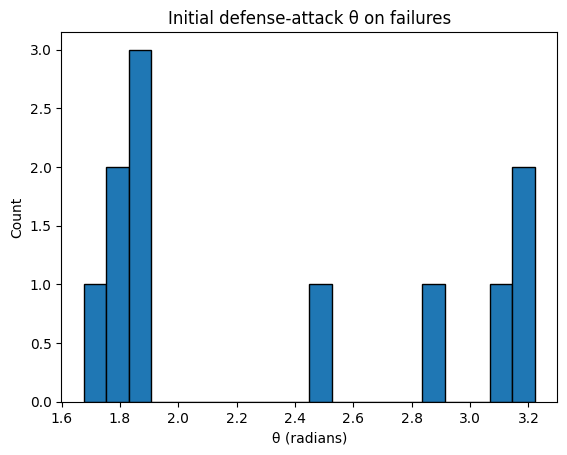

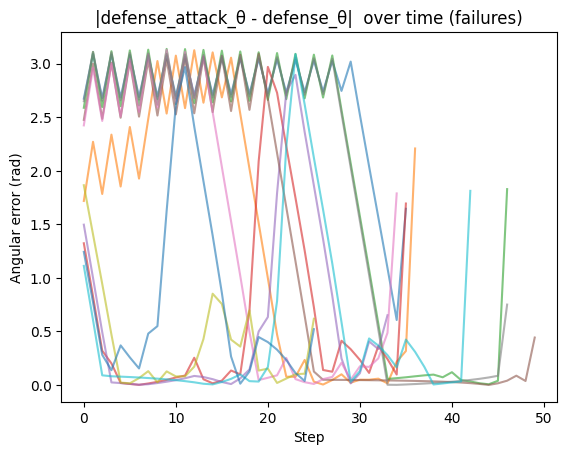

In [29]:
import random
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML, display
from stable_baselines3 import DQN
from stable_baselines3.common.env_util import make_vec_env
from tqdm import trange  # pip install tqdm

# -------------------------------------------------------------------
# 1) animate_episode (unchanged from before)
# -------------------------------------------------------------------
def animate_episode(episode_data, save_name=None):
    past_def_x, past_def_y = zip(*episode_data["past_defense_positions"])
    past_att_x, past_att_y = zip(*episode_data["past_attack_positions"])
    def_x, def_y           = zip(*episode_data["defense_positions"])
    att_x, att_y           = zip(*episode_data["attack_positions"])
    tgt_x, tgt_y           = episode_data["target_position"]

    fig, ax = plt.subplots()
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)
    ax.axhline(0, color='black', linewidth=0.5)
    ax.axvline(0, color='black', linewidth=0.5)
    ax.grid(True)

    trail_att, = ax.plot([], [], color='#FFA281', label='Attack Trail')
    trail_def, = ax.plot([], [], color='#858585', label='Defense Trail')
    pt_def,   = ax.plot([], [], 'o', color='#1C1C1C', label='Defense')
    pt_att,   = ax.plot([], [], 'o', color='#FF5A1F', label='Attack')
    pt_tgt,   = ax.plot([tgt_x], [tgt_y], 'o', color='#85A3FF', label='Target')

    ax.legend(loc='upper right')

    def update(frame):
        trail_att.set_data(past_att_x[:frame+1], past_att_y[:frame+1])
        trail_def.set_data(past_def_x[:frame+1], past_def_y[:frame+1])
        pt_def.set_data([def_x[frame]], [def_y[frame]])
        pt_att.set_data([att_x[frame]], [att_y[frame]])
        return trail_att, trail_def, pt_def, pt_att, pt_tgt

    ani = animation.FuncAnimation(fig, update, frames=len(def_x), interval=200, blit=True)

    if save_name:
        ani.save(save_name, writer='pillow')
        print(f"Saved animation as {save_name}")

    plt.close(fig)
    display(HTML(ani.to_html5_video()))

# -------------------------------------------------------------------
# 2) evaluate_and_collect_failures (unchanged)
# -------------------------------------------------------------------
def evaluate_and_collect_failures(model_path, n_episodes=1000, step_limit=1000):
    env   = make_vec_env(lambda: missile_interception(), n_envs=1)
    model = DQN.load(model_path)

    fail_episodes = []
    for ep in trange(n_episodes, desc="Eval failures"):
        obs        = env.reset()
        init_theta = obs[0][6]
        done       = False
        steps      = 0

        ep_data = {
            'past_defense_positions': [],
            'past_attack_positions' : [],
            'defense_positions'      : [],
            'attack_positions'       : [],
            'target_position'        : obs[0][4:6].tolist(),
            'actions'                : [],
            'rewards'                : [],
            'defense_angle'          : [],
            'defense_attack_theta'   : [],
        }

        while not done and steps < step_limit:
            action, _ = model.predict(obs, deterministic=True)
            ep_data['actions'].append(int(action[0]))
            ep_data['past_attack_positions'].append(obs[0][0:2].tolist())
            ep_data['past_defense_positions'].append(obs[0][2:4].tolist())

            obs, reward, dones, infos = env.step(action)
            done     = dones[0]
            info     = infos[0]

            ep_data['rewards'].append(float(reward))
            ep_data['defense_angle'].append(float(obs[0][8]))
            ep_data['defense_attack_theta'].append(float(obs[0][6]))
            ep_data['defense_positions'].append(obs[0][0:2].tolist())
            ep_data['attack_positions'].append(obs[0][2:4].tolist())

            steps += 1

        if info.get('activated', False):
            fail_episodes.append(ep_data)

    print(f"\nCollected {len(fail_episodes)} failures out of {n_episodes} episodes")
    return fail_episodes

# -------------------------------------------------------------------
# 3) Main: animate *all* failures + plot angles
# -------------------------------------------------------------------
if __name__ == "__main__":
    MODEL    = "dqn_missile_guidance_v(2.4.2.5)_PROD_11"
    failures = evaluate_and_collect_failures(MODEL, n_episodes=2000)

    # 3a) Animate every failure
    for idx, ep_data in enumerate(failures):
        animate_episode(ep_data, save_name=f"failure_{idx}.gif")

    # 3b) Gather the initial defense-attack thetas
    init_thetas = [ ep['defense_attack_theta'][0] for ep in failures ]
    print("Initial defense→attack thetas of all failures:")
    print(init_thetas)

    # plot their distribution
    plt.figure()
    plt.hist(init_thetas, bins=20, edgecolor='k')
    plt.title("Initial defense-attack θ on failures")
    plt.xlabel("θ (radians)")
    plt.ylabel("Count")
    plt.show()

    # 3c) Plot the angle difference over time for each failure
    plt.figure()
    for ep_data in failures:
        da = np.array(ep_data['defense_attack_theta'])
        a  = np.array(ep_data['defense_angle'])
        diff = np.minimum(np.abs(da - a), 2*np.pi - np.abs(da - a))
        plt.plot(diff, alpha=0.6)
    plt.title("|defense_attack_θ - defense_θ|  over time (failures)")
    plt.xlabel("Step")
    plt.ylabel("Angular error (rad)")
    plt.show()
